In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
%matplotlib inline

import warnings

warnings.filterwarnings('ignore')


In [2]:
train_df = pd.read_csv("C:/Users/HOME/Desktop/dataset/kaggle_dataset/pulsar star/pulsar_data_train.csv")
test_df = pd.read_csv("C:/Users/HOME/Desktop/dataset/kaggle_dataset/pulsar star/pulsar_data_test.csv")

# Exploratory data analysis 

In [3]:
# view dimensions of dataset

train_df.shape

(12528, 9)

In [4]:
test_df.shape

(5370, 9)

In [5]:
# view the column names of the dataframe

col_names = train_df.columns

col_names

Index([' Mean of the integrated profile',
       ' Standard deviation of the integrated profile',
       ' Excess kurtosis of the integrated profile',
       ' Skewness of the integrated profile', ' Mean of the DM-SNR curve',
       ' Standard deviation of the DM-SNR curve',
       ' Excess kurtosis of the DM-SNR curve', ' Skewness of the DM-SNR curve',
       'target_class'],
      dtype='object')

We can see that there are leading spaces (spaces at the start of the string name) in the dataframe. So, I will remove these leading spaces.

In [6]:
# remove leading spaces from column names

train_df.columns = train_df.columns.str.strip()

test_df.columns = test_df.columns.str.strip()

In [7]:
# rename column names

train_df.columns = ['IP Mean', 'IP Sd', 'IP Kurtosis', 'IP Skewness', 
              'DM-SNR Mean', 'DM-SNR Sd', 'DM-SNR Kurtosis', 'DM-SNR Skewness', 'target_class']

In [8]:
# rename column names

test_df.columns = ['IP Mean', 'IP Sd', 'IP Kurtosis', 'IP Skewness', 
              'DM-SNR Mean', 'DM-SNR Sd', 'DM-SNR Kurtosis', 'DM-SNR Skewness', 'target_class']

# Our target variable is the target_class column. So, I will check its distribution.

In [9]:
# check distribution of target_class column

train_df['target_class'].value_counts()

0.0    11375
1.0     1153
Name: target_class, dtype: int64

In [10]:
# view the percentage distribution of target_class column

train_df['target_class'].value_counts()/np.float(len(train_df))

0.0    0.907966
1.0    0.092034
Name: target_class, dtype: float64

We can see that percentage of observations of the class label 0 and 1 is 90% and 9%. So, this is a class imbalanced problem. I will deal with that in later section

In [11]:
# view summary of dataset

train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12528 entries, 0 to 12527
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   IP Mean          12528 non-null  float64
 1   IP Sd            12528 non-null  float64
 2   IP Kurtosis      10793 non-null  float64
 3   IP Skewness      12528 non-null  float64
 4   DM-SNR Mean      12528 non-null  float64
 5   DM-SNR Sd        11350 non-null  float64
 6   DM-SNR Kurtosis  12528 non-null  float64
 7   DM-SNR Skewness  11903 non-null  float64
 8   target_class     12528 non-null  float64
dtypes: float64(9)
memory usage: 881.0 KB


In [12]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

Imported AutoViz_Class version: 0.0.84. Call using:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not show plot but creates them and saves them in AutoViz_Plots directory in your local machine.


Shape of your Data Set loaded: (12528, 9)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  8
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  1
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    9 Predictors classified...
        This does not include the Target column(s)
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 36


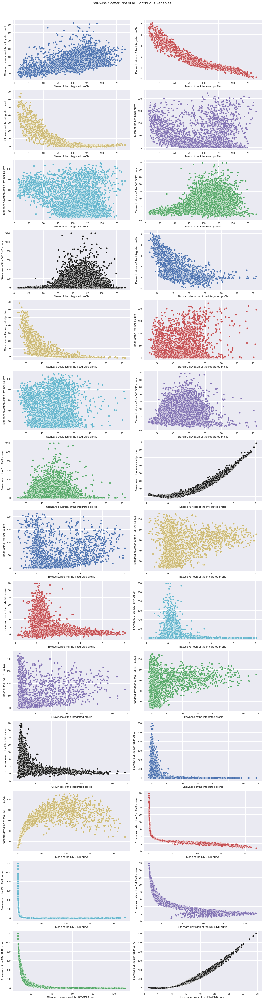

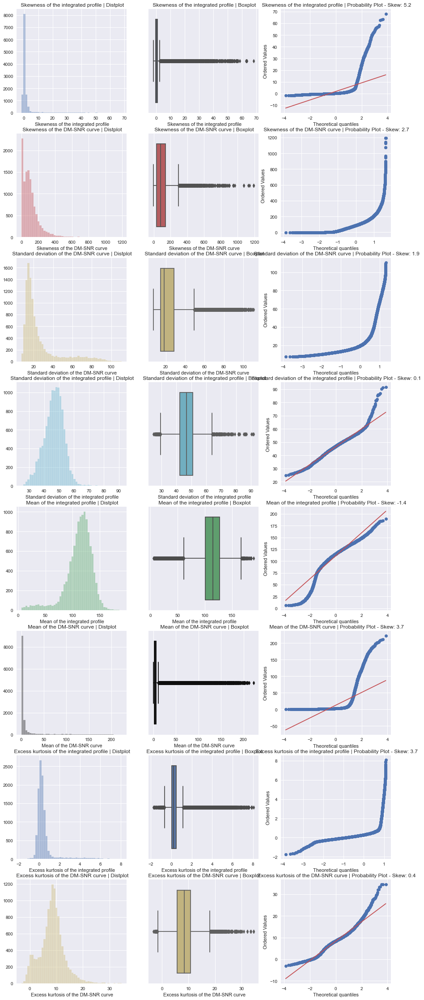

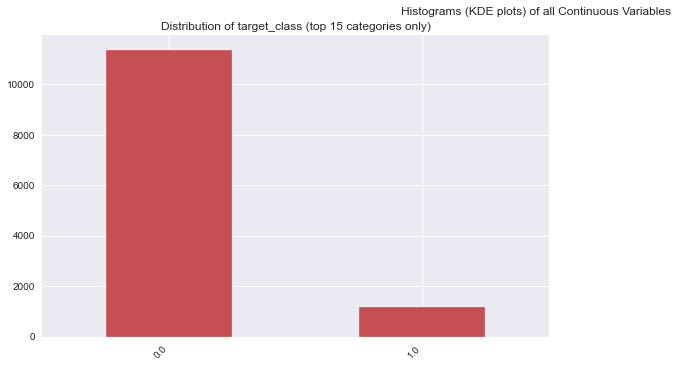

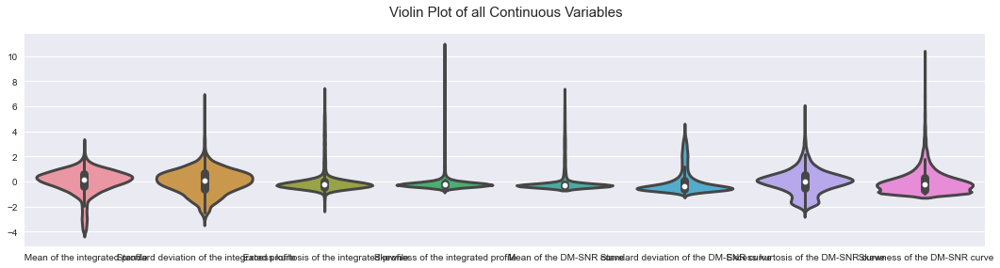

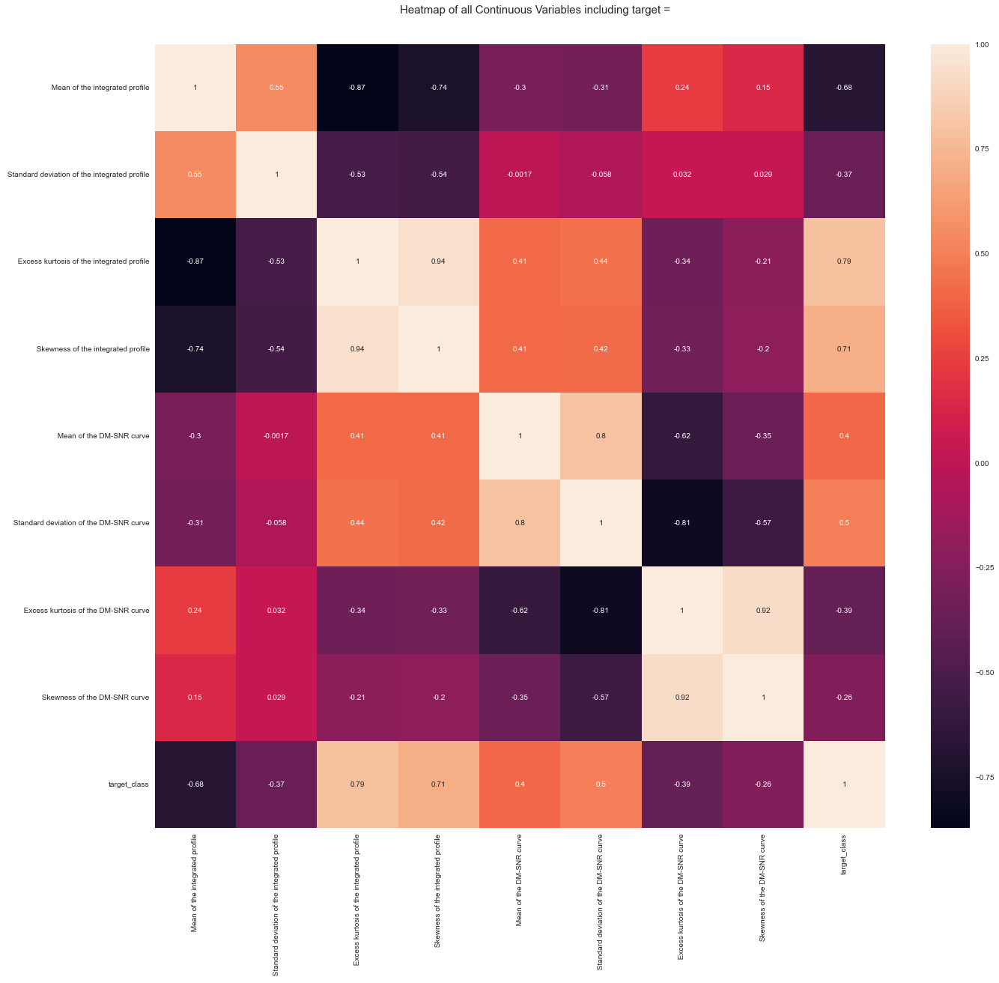

No categorical or numeric vars in data set. Hence no bar charts.
Time to run AutoViz (in seconds) = 10.848

 ###################### VISUALIZATION Completed ########################


In [13]:
train_df = AV.AutoViz("C:/Users/HOME/Desktop/dataset/kaggle_dataset/pulsar star/pulsar_data_train.csv")


In [14]:
import dtale
import pandas as pd
d = dtale.show(train_df)
d.open_browser()

In [15]:
import pandas_profiling as pp

2021-10-10 02:42:53,591 - INFO     - Pandas backend loaded 1.3.2
2021-10-10 02:42:53,607 - INFO     - Numpy backend loaded 1.20.3
2021-10-10 02:42:53,609 - INFO     - Pyspark backend NOT loaded
2021-10-10 02:42:53,610 - INFO     - Python backend loaded


In [16]:
train_df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
test_df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
train_df.columns = ['IP Mean', 'IP Sd', 'IP Kurtosis', 'IP Skewness', 
              'DM-SNR Mean', 'DM-SNR Sd', 'DM-SNR Kurtosis', 'DM-SNR Skewness', 'target_class']

In [19]:
train_df.isna().sum()

IP Mean               0
IP Sd                 0
IP Kurtosis        1735
IP Skewness           0
DM-SNR Mean           0
DM-SNR Sd          1178
DM-SNR Kurtosis       0
DM-SNR Skewness     625
target_class          0
dtype: int64

In [20]:
train_df['IP Kurtosis'].fillna((train_df['IP Kurtosis'].median()), inplace=True)
train_df['DM-SNR Sd'].fillna((train_df['DM-SNR Sd'].median()), inplace=True)
train_df['DM-SNR Skewness'].fillna((train_df['DM-SNR Skewness'].median()), inplace=True)


In [21]:
train_df.isna().sum()

IP Mean            0
IP Sd              0
IP Kurtosis        0
IP Skewness        0
DM-SNR Mean        0
DM-SNR Sd          0
DM-SNR Kurtosis    0
DM-SNR Skewness    0
target_class       0
dtype: int64

In [22]:
test_df.isna().sum()

IP Mean               0
IP Sd                 0
IP Kurtosis         767
IP Skewness           0
DM-SNR Mean           0
DM-SNR Sd           524
DM-SNR Kurtosis       0
DM-SNR Skewness     244
target_class       5370
dtype: int64

In [23]:
test_df['IP Kurtosis'].fillna((test_df['IP Kurtosis'].median()), inplace=True)
test_df['DM-SNR Sd'].fillna((test_df['DM-SNR Sd'].median()), inplace=True)

test_df['DM-SNR Skewness'].fillna((test_df['DM-SNR Skewness'].median()), inplace=True)


In [24]:
test_df.isna().sum()

IP Mean               0
IP Sd                 0
IP Kurtosis           0
IP Skewness           0
DM-SNR Mean           0
DM-SNR Sd             0
DM-SNR Kurtosis       0
DM-SNR Skewness       0
target_class       5370
dtype: int64

I will draw boxplots to visualise outliers in the above variables.

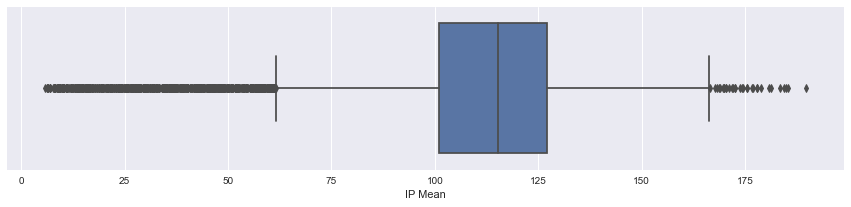

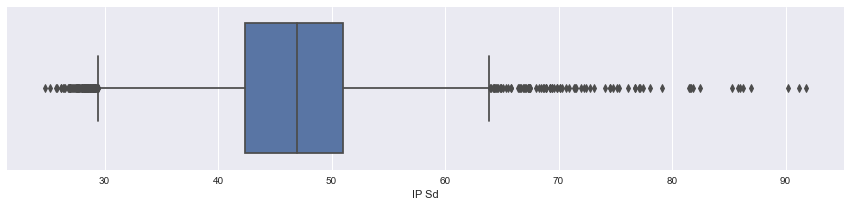

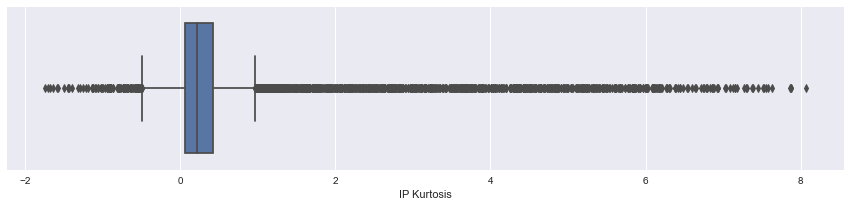

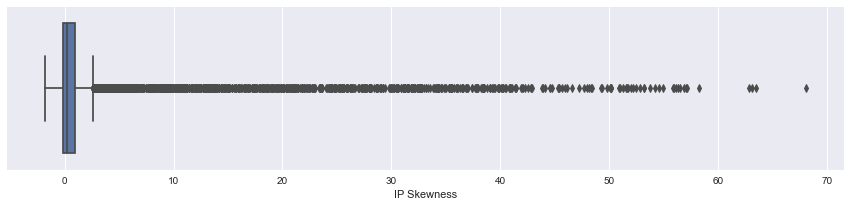

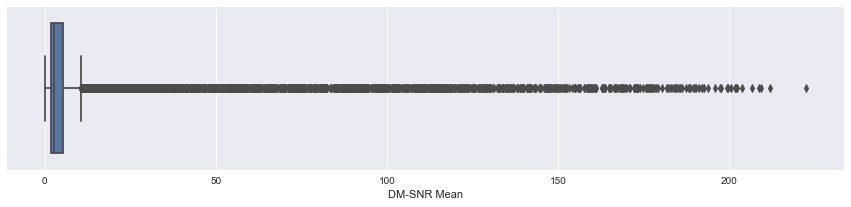

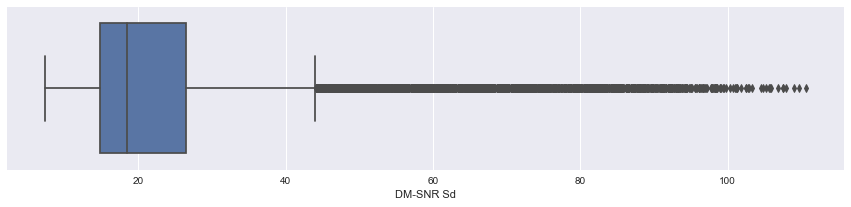

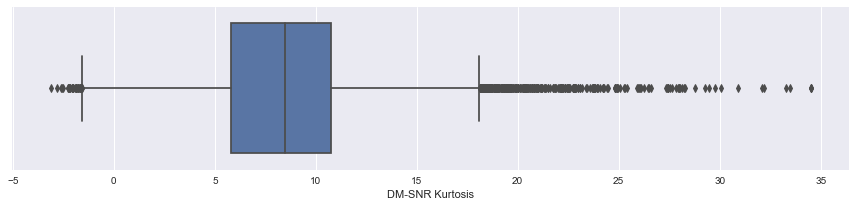

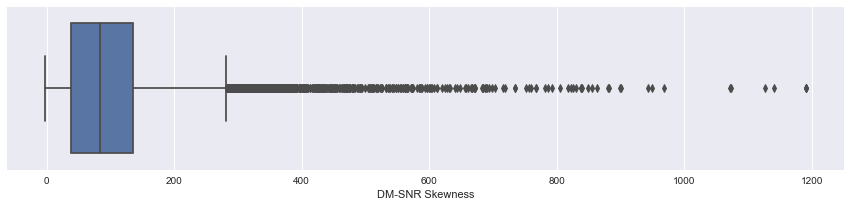

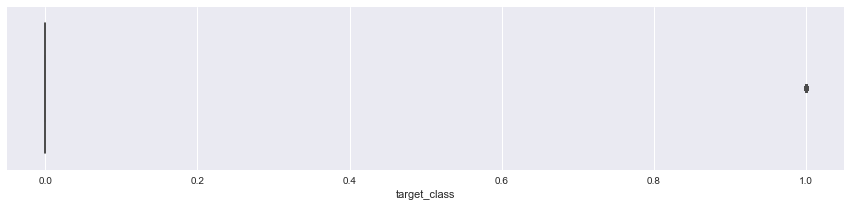

In [25]:
df1=train_df.select_dtypes(exclude=['object'])
import matplotlib.pyplot as plt

for column in df1:
        plt.figure(figsize=(15,3))
        sns.boxplot(data=df1, x=column)

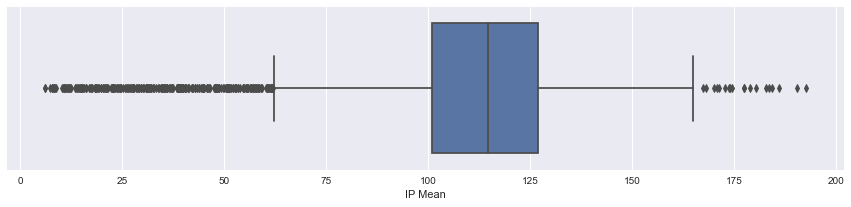

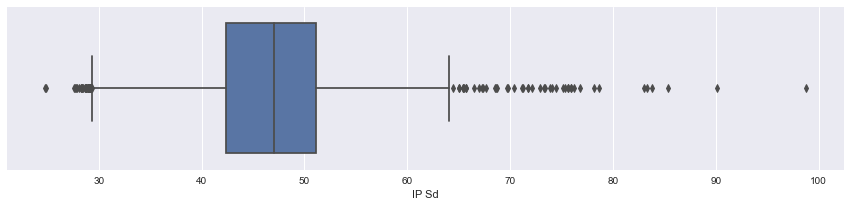

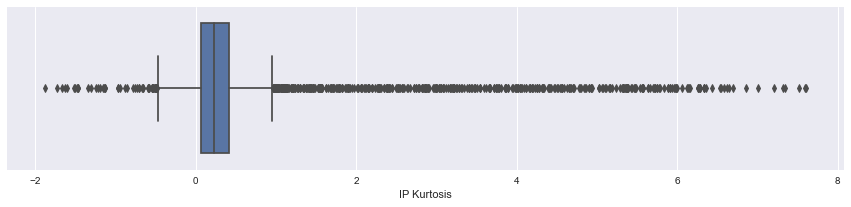

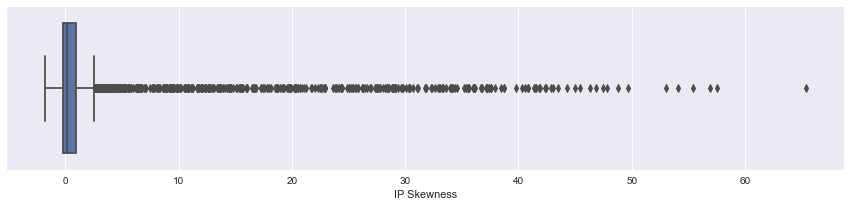

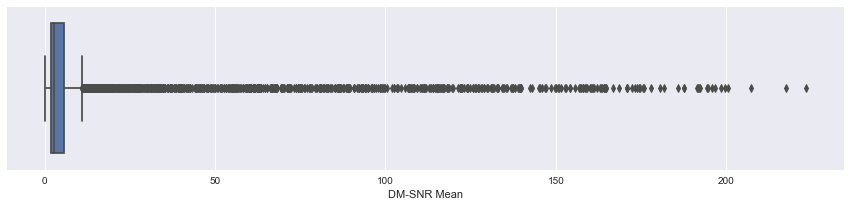

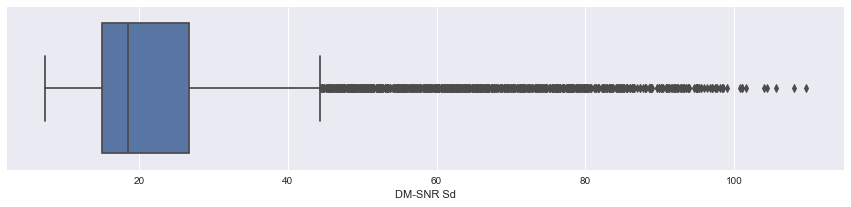

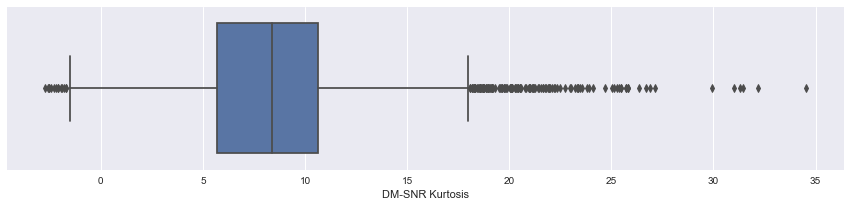

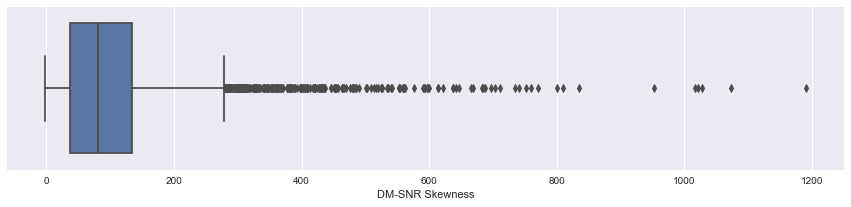

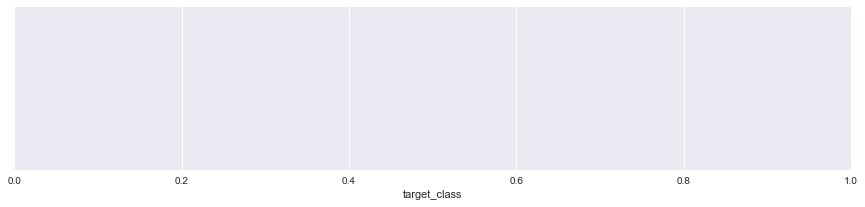

In [26]:
df2=test_df.select_dtypes(exclude=['object'])
import matplotlib.pyplot as plt

for column in df2:
        plt.figure(figsize=(15,3))
        sns.boxplot(data=df2, x=column)

array([[<AxesSubplot:title={'center':'IP Mean'}>,
        <AxesSubplot:title={'center':'IP Sd'}>,
        <AxesSubplot:title={'center':'IP Kurtosis'}>],
       [<AxesSubplot:title={'center':'IP Skewness'}>,
        <AxesSubplot:title={'center':'DM-SNR Mean'}>,
        <AxesSubplot:title={'center':'DM-SNR Sd'}>],
       [<AxesSubplot:title={'center':'DM-SNR Kurtosis'}>,
        <AxesSubplot:title={'center':'DM-SNR Skewness'}>,
        <AxesSubplot:title={'center':'target_class'}>]], dtype=object)

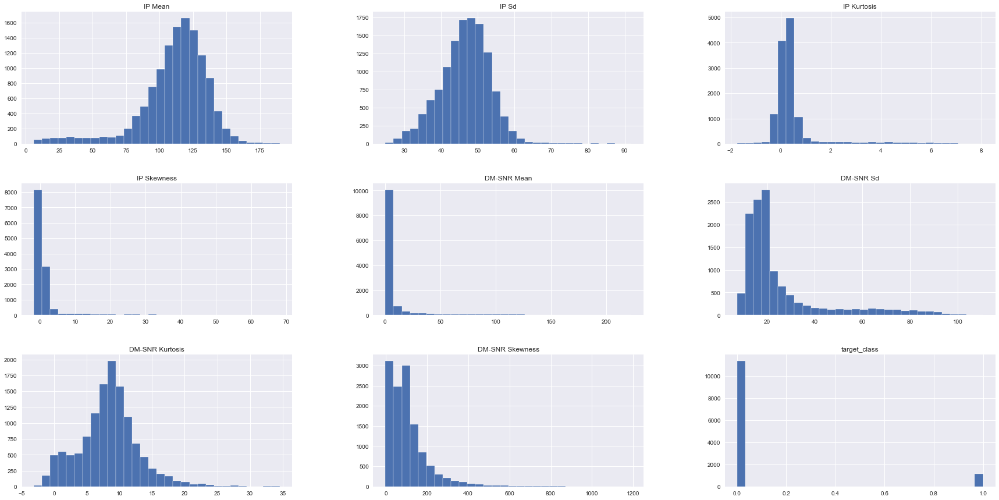

In [27]:
train_df.hist(bins=30, figsize=(30, 15))

array([[<AxesSubplot:title={'center':'IP Mean'}>,
        <AxesSubplot:title={'center':'IP Sd'}>,
        <AxesSubplot:title={'center':'IP Kurtosis'}>],
       [<AxesSubplot:title={'center':'IP Skewness'}>,
        <AxesSubplot:title={'center':'DM-SNR Mean'}>,
        <AxesSubplot:title={'center':'DM-SNR Sd'}>],
       [<AxesSubplot:title={'center':'DM-SNR Kurtosis'}>,
        <AxesSubplot:title={'center':'DM-SNR Skewness'}>,
        <AxesSubplot:title={'center':'target_class'}>]], dtype=object)

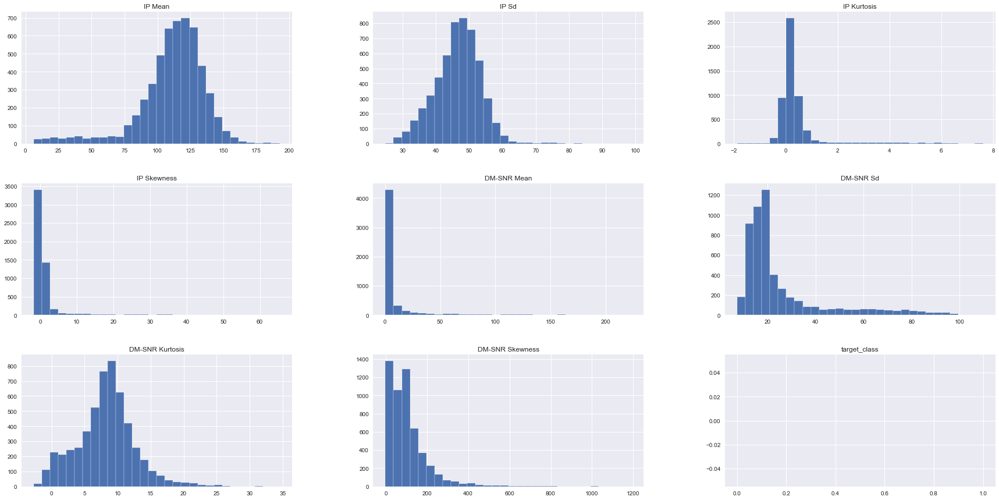

In [28]:
test_df.hist(bins=30, figsize=(30, 15))

In [37]:
y=train_df['target_class']
x=train_df.drop('target_class',axis=1)

In [38]:
from sklearn.model_selection import train_test_split

In [40]:
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

# Feature Scaling  mandatory for SVM

In [41]:
# check the shape of X_train and X_test

X_train.shape,X_test.shape


((10022, 8), (2506, 8))

In [42]:
cols = X_train.columns

# Scaling using SKlearn STANDARD scalar

In [43]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)



In [45]:
from sklearn.ensemble import RandomForestClassifier
model=RandomForestClassifier(max_depth=2,random_state=0)
model.fit(xtrain,ytrain)
pred=model.predict(xval)
print(f'the Accuracy of the model is {round(accuracy_score(yval,pred)*100,4)}%')

the Accuracy of the model is 97.6856%


In [47]:
X_train = pd.DataFrame(X_train, columns=[cols])

In [48]:
X_train.describe()

,IP Mean,IP Sd,IP Kurtosis,IP Skewness,DM-SNR Mean,DM-SNR Sd,DM-SNR Kurtosis,DM-SNR Skewness
count,1.002200e+04,1.002200e+04,1.002200e+04,1.002200e+04,1.002200e+04,1.002200e+04,1.002200e+04,1.002200e+04
mean,-6.504365e-17,-3.447540e-16,1.064804e-16,2.044142e-17,-1.972413e-17,1.241219e-16,5.373869e-17,3.424166e-17
std,1.000050e+00,1.000050e+00,1.000050e+00,1.000050e+00,1.000050e+00,1.000050e+00,1.000050e+00,1.000050e+00
min,-4.068339e+00,-3.134139e+00,-2.178982e+00,-5.727451e-01,-4.214866e-01,-9.746989e-01,-2.455262e+00,-1.009988e+00
25%,-3.959611e-01,-6.097959e-01,-3.882453e-01,-3.173982e-01,-3.643063e-01,-5.809650e-01,-5.566043e-01,-6.314859e-01
50%,1.596222e-01,6.301244e-02,-2.204078e-01,-2.550993e-01,-3.344944e-01,-3.864928e-01,2.694159e-02,-1.987291e-01
75%,6.302598e-01,6.596210e-01,-2.486426e-02,-1.375948e-01,-2.455011e-01,6.126994e-02,5.321119e-01,3.029570e-01
max,3.042041e+00,6.582758e+00,7.612941e+00,1.056901e+01,6.601589e+00,4.474023e+00,5.789238e+00,1.036570e+01


In [50]:
target=test_df['target_class']
featureData=test_df.drop('target_class',axis=1)
target=model.predict(featureData)
print(target)
print(target.shape)

[0. 1. 0. ... 0. 0. 0.]
(5370,)


# SVM with default hyperparameters 

Table of Contents

Default hyperparameter means C=1.0, kernel=rbf and gamma=auto among other parameters

In [51]:
# import SVC classifier
from sklearn.svm import SVC


# import metrics to compute accuracy
from sklearn.metrics import accuracy_score


# instantiate classifier with default hyperparameters
svc=SVC() 


# fit classifier to training set
svc.fit(X_train,y_train)


# make predictions on test set
y_pred=svc.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with default hyperparameters: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))


Model accuracy score with default hyperparameters: 0.9796


# Run SVM with rbf kernel and C=100.0
We have seen that there are outliers in our dataset. So, we should increase the value of C as higher C means fewer outliers. So, I will run SVM with kernel=rbf and C=100.0.

In [52]:
# instantiate classifier with rbf kernel and C=100
svc=SVC(C=100.0) 


# fit classifier to training set
svc.fit(X_train,y_train)


# make predictions on test set
y_pred=svc.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with rbf kernel and C=100.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with rbf kernel and C=100.0 : 0.9789


# Now, I will further increase the value of C=1000.0 and check accuracy.

In [53]:
# instantiate classifier with rbf kernel and C=1000
svc=SVC(C=1000.0) 


# fit classifier to training set
svc.fit(X_train,y_train)


# make predictions on test set
y_pred=svc.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with rbf kernel and C=1000.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with rbf kernel and C=1000.0 : 0.9781


# Run SVM with linear kernel 
Table of Contents

Run SVM with linear kernel and C=1.0

In [54]:
# instantiate classifier with linear kernel and C=1.0
linear_svc=SVC(kernel='linear', C=1.0) 


# fit classifier to training set
linear_svc.fit(X_train,y_train)


# make predictions on test set
y_pred_test=linear_svc.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with linear kernel and C=1.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred_test)))

Model accuracy score with linear kernel and C=1.0 : 0.9781


# Run SVM with linear kernel and C=100.0

In [56]:
# instantiate classifier with linear kernel and C=100.0
linear_svc100=SVC(kernel='linear', C=100.0) 


# fit classifier to training set
linear_svc100.fit(X_train, y_train)


# make predictions on test set
y_pred=linear_svc100.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with linear kernel and C=100.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with linear kernel and C=100.0 : 0.9785


# Run SVM with linear kernel and C=1000.0

In [57]:
# instantiate classifier with linear kernel and C=1000.0
linear_svc1000=SVC(kernel='linear', C=1000.0) 


# fit classifier to training set
linear_svc1000.fit(X_train, y_train)


# make predictions on test set
y_pred=linear_svc1000.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with linear kernel and C=1000.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with linear kernel and C=1000.0 : 0.9785


# Compare the train-set and test-set accuracy
Now, I will compare the train-set and test-set accuracy to check for overfitting.

In [58]:
y_pred_train = linear_svc.predict(X_train)

y_pred_train

array([0., 0., 0., ..., 1., 0., 0.])

In [59]:
print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train)))

Training-set accuracy score: 0.9750


# Check for overfitting and underfitting

In [60]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(linear_svc.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(linear_svc.score(X_test, y_test)))

Training set score: 0.9750
Test set score: 0.9781


NO overfitting

# Compare model accuracy with null accuracy
So, the model accuracy is 0.9832. But, we cannot say that our model is very good based on the above accuracy. We must compare it with the null accuracy. Null accuracy is the accuracy that could be achieved by always predicting the most frequent class.

So, we should first check the class distribution in the test set.

In [61]:
# check class distribution in test set

y_test.value_counts()

0.0    2279
1.0     227
Name: target_class, dtype: int64

In [62]:
# check null accuracy score

null_accuracy = (3306/(3306+274))

print('Null accuracy score: {0:0.4f}'. format(null_accuracy))

Null accuracy score: 0.9235


We can see that our model accuracy score is 0.9830 but null accuracy score is 0.9235. So, we can conclude that our SVM classifier is doing a very good job in predicting the class labels.

# Run SVM with polynomial kernel

Run SVM with polynomial kernel and C=1.0

In [63]:
# instantiate classifier with polynomial kernel and C=1.0
poly_svc=SVC(kernel='poly', C=1.0) 


# fit classifier to training set
poly_svc.fit(X_train,y_train)


# make predictions on test set
y_pred=poly_svc.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with polynomial kernel and C=1.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with polynomial kernel and C=1.0 : 0.9757


# Run SVM with polynomial kernel and C=100.0

In [64]:
# instantiate classifier with polynomial kernel and C=100.0
poly_svc100=SVC(kernel='poly', C=100.0) 


# fit classifier to training set
poly_svc100.fit(X_train, y_train)


# make predictions on test set
y_pred=poly_svc100.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with polynomial kernel and C=1.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with polynomial kernel and C=1.0 : 0.9812


Polynomial kernel gives poor performance. It may be overfitting the training set.

# Run SVM with sigmoid kernel

In [65]:
# instantiate classifier with sigmoid kernel and C=1.0
sigmoid_svc=SVC(kernel='sigmoid', C=1.0) 


# fit classifier to training set
sigmoid_svc.fit(X_train,y_train)


# make predictions on test set
y_pred=sigmoid_svc.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with sigmoid kernel and C=1.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with sigmoid kernel and C=1.0 : 0.8755


In [66]:
# instantiate classifier with sigmoid kernel and C=100.0
sigmoid_svc100=SVC(kernel='sigmoid', C=100.0) 


# fit classifier to training set
sigmoid_svc100.fit(X_train,y_train)


# make predictions on test set
y_pred=sigmoid_svc100.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with sigmoid kernel and C=100.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with sigmoid kernel and C=100.0 : 0.8755


# CONFUSION MATRIX

In [67]:
# Print the Confusion Matrix and slice it into four pieces

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred_test)

print('Confusion matrix\n\n', cm)

print('\nTrue Positives(TP) = ', cm[0,0])

print('\nTrue Negatives(TN) = ', cm[1,1])

print('\nFalse Positives(FP) = ', cm[0,1])

print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[2274    5]
 [  50  177]]

True Positives(TP) =  2274

True Negatives(TN) =  177

False Positives(FP) =  5

False Negatives(FN) =  50


<AxesSubplot:>

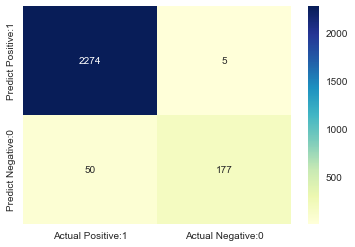

In [68]:
# visualize confusion matrix with seaborn heatmap

cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# Classification metrices 

In [69]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      2279
         1.0       0.97      0.78      0.87       227

    accuracy                           0.98      2506
   macro avg       0.98      0.89      0.93      2506
weighted avg       0.98      0.98      0.98      2506



# Classification accuracy

In [70]:
TP = cm[0,0]
TN = cm[1,1]
FP = cm[0,1]
FN = cm[1,0]

In [71]:
# print classification accuracy

classification_accuracy = (TP + TN) / float(TP + TN + FP + FN)

print('Classification accuracy : {0:0.4f}'.format(classification_accuracy))

Classification accuracy : 0.9781


# print classification error


In [72]:

classification_error = (FP + FN) / float(TP + TN + FP + FN)

print('Classification error : {0:0.4f}'.format(classification_error))

Classification error : 0.0219


# PRECISION

In [73]:
# print precision score

precision = TP / float(TP + FP)


print('Precision : {0:0.4f}'.format(precision))

Precision : 0.9978


# RECALL// sensitivity

In [74]:
recall = TP / float(TP + FN)

print('Recall or Sensitivity : {0:0.4f}'.format(recall))

Recall or Sensitivity : 0.9785


# True Positive Rate
True Positive Rate is synonymous with Recall.

In [75]:
true_positive_rate = TP / float(TP + FN)


print('True Positive Rate : {0:0.4f}'.format(true_positive_rate))

True Positive Rate : 0.9785


# False Positive Rate

In [76]:
false_positive_rate = FP / float(FP + TN)


print('False Positive Rate : {0:0.4f}'.format(false_positive_rate))

False Positive Rate : 0.0275


In [77]:
specificity = TN / (TN + FP)

print('Specificity : {0:0.4f}'.format(specificity))

Specificity : 0.9725


# ROC - AUC 

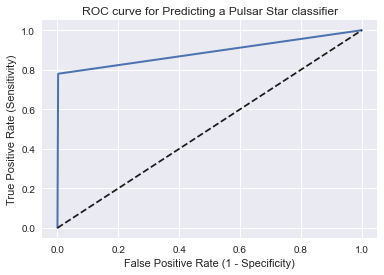

In [78]:
# plot ROC Curve

from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_test, y_pred_test)

plt.figure(figsize=(6,4))

plt.plot(fpr, tpr, linewidth=2)

plt.plot([0,1], [0,1], 'k--' )

plt.rcParams['font.size'] = 12

plt.title('ROC curve for Predicting a Pulsar Star classifier')

plt.xlabel('False Positive Rate (1 - Specificity)')

plt.ylabel('True Positive Rate (Sensitivity)')

plt.show()

In [79]:
# compute ROC AUC

from sklearn.metrics import roc_auc_score

ROC_AUC = roc_auc_score(y_test, y_pred_test)

print('ROC AUC : {:.4f}'.format(ROC_AUC))

ROC AUC : 0.8888


In [80]:
# calculate cross-validated ROC AUC 

from sklearn.model_selection import cross_val_score

Cross_validated_ROC_AUC = cross_val_score(linear_svc, X_train, y_train, cv=10, scoring='roc_auc').mean()

print('Cross validated ROC AUC : {:.4f}'.format(Cross_validated_ROC_AUC))

Cross validated ROC AUC : 0.9676


# Stratified k-fold Cross Validation with shuffle split

In [82]:
from sklearn.model_selection import KFold


kfold=KFold(n_splits=5, shuffle=True, random_state=0)


linear_svc=SVC(kernel='linear')


linear_scores = cross_val_score(linear_svc, x, y, cv=kfold)

In [83]:
# print cross-validation scores with linear kernel

print('Stratified cross-validation scores with linear kernel:\n\n{}'.format(linear_scores))

Stratified cross-validation scores with linear kernel:

[0.97725459 0.97845172 0.97565842 0.9740519  0.9752495 ]


In [84]:
# print average cross-validation score with linear kernel

print('Average stratified cross-validation score with linear kernel:{:.4f}'.format(linear_scores.mean()))

Average stratified cross-validation score with linear kernel:0.9761


# Stratified k-Fold Cross Validation with shuffle split with rbf kernel

In [86]:
rbf_svc=SVC(kernel='rbf')


rbf_scores = cross_val_score(rbf_svc, x, y, cv=kfold)

In [87]:
# print cross-validation scores with rbf kernel

print('Stratified Cross-validation scores with rbf kernel:\n\n{}'.format(rbf_scores))

Stratified Cross-validation scores with rbf kernel:

[0.97286512 0.97286512 0.96927374 0.97205589 0.96806387]


In [88]:
# print average cross-validation score with rbf kernel

print('Average stratified cross-validation score with rbf kernel:{:.4f}'.format(rbf_scores.mean()))

Average stratified cross-validation score with rbf kernel:0.9710


# Hyperparameter Optimization using GridSearch CV

In [89]:
# import GridSearchCV
from sklearn.model_selection import GridSearchCV


# import SVC classifier
from sklearn.svm import SVC


# instantiate classifier with default hyperparameters with kernel=rbf, C=1.0 and gamma=auto
svc=SVC() 



# declare parameters for hyperparameter tuning
parameters = [ {'C':[1, 10, 100, 1000], 'kernel':['linear']},
               {'C':[1, 10, 100, 1000], 'kernel':['rbf'], 'gamma':[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]},
               {'C':[1, 10, 100, 1000], 'kernel':['poly'], 'degree': [2,3,4] ,'gamma':[0.01,0.02,0.03,0.04,0.05]} 
              ]




grid_search = GridSearchCV(estimator = svc,  
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           verbose=0)


grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid=[{'C': [1, 10, 100, 1000], 'kernel': ['linear']},
                         {'C': [1, 10, 100, 1000],
                          'gamma': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                                    0.9],
                          'kernel': ['rbf']},
                         {'C': [1, 10, 100, 1000], 'degree': [2, 3, 4],
                          'gamma': [0.01, 0.02, 0.03, 0.04, 0.05],
                          'kernel': ['poly']}],
             scoring='accuracy')

In [90]:
# examine the best model


# best score achieved during the GridSearchCV
print('GridSearch CV best score : {:.4f}\n\n'.format(grid_search.best_score_))


# print parameters that give the best results
print('Parameters that give the best results :','\n\n', (grid_search.best_params_))


# print estimator that was chosen by the GridSearch
print('\n\nEstimator that was chosen by the search :','\n\n', (grid_search.best_estimator_))

GridSearch CV best score : 0.9789


Parameters that give the best results : 

 {'C': 10, 'gamma': 0.2, 'kernel': 'rbf'}


Estimator that was chosen by the search : 

 SVC(C=10, gamma=0.2)


In [91]:
# calculate GridSearch CV score on test set

print('GridSearch CV score on test set: {0:0.4f}'.format(grid_search.score(X_test, y_test)))

GridSearch CV score on test set: 0.9804
